In [151]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import joblib

from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score 
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC

#Data overview

In [33]:
data = pd.read_csv("data/smoking.csv")

In [34]:
data = data.drop([9302], axis=0) #droping becouse there is no value "smoking"

In [35]:
data.head()

,ID,gender,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),...,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,oral,dental caries,tartar,smoking
0,0,F,40,155,60,81.3,1.2,1.0,1.0,1.0,...,12.9,1.0,0.7,18.0,19.0,27.0,Y,0,Y,0
1,1,F,40,160,60,81.0,0.8,0.6,1.0,1.0,...,12.7,1.0,0.6,22.0,19.0,18.0,Y,0,Y,0
2,2,M,55,170,60,80.0,0.8,0.8,1.0,1.0,...,15.8,1.0,1.0,21.0,16.0,22.0,Y,0,N,1
3,3,M,40,165,70,88.0,1.5,1.5,1.0,1.0,...,14.7,1.0,1.0,19.0,26.0,18.0,Y,0,Y,0
4,4,F,40,155,60,86.0,1.0,1.0,1.0,1.0,...,12.5,1.0,0.6,16.0,14.0,22.0,Y,0,N,0


In [36]:
X = data.drop(['smoking'], axis=1)
y = data['smoking']

In [40]:
X.shape

(55691, 26)

In [41]:
y.shape

(55691,)

In [42]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 55691 entries, 0 to 55691
Data columns (total 27 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   55691 non-null  int64  
 1   gender               55691 non-null  object 
 2   age                  55691 non-null  int64  
 3   height(cm)           55691 non-null  int64  
 4   weight(kg)           55691 non-null  int64  
 5   waist(cm)            55691 non-null  float64
 6   eyesight(left)       55691 non-null  float64
 7   eyesight(right)      55691 non-null  float64
 8   hearing(left)        55691 non-null  float64
 9   hearing(right)       55691 non-null  float64
 10  systolic             55691 non-null  float64
 11  relaxation           55691 non-null  float64
 12  fasting blood sugar  55691 non-null  float64
 13  Cholesterol          55691 non-null  float64
 14  triglyceride         55691 non-null  float64
 15  HDL                  55691 non-null 

In [43]:
X.nunique().sort_values()

oral                       1
tartar                     2
dental caries              2
hearing(left)              2
hearing(right)             2
gender                     2
Urine protein              6
height(cm)                13
age                       14
eyesight(right)           17
eyesight(left)            19
weight(kg)                22
serum creatinine          38
relaxation                95
HDL                      126
systolic                 130
hemoglobin               145
AST                      219
ALT                      245
fasting blood sugar      276
Cholesterol              286
LDL                      289
triglyceride             390
Gtp                      488
waist(cm)                566
ID                     55691
dtype: int64

In [44]:
cols_name=['gender', 'Gtp', 'triglyceride', 'hemoglobin', 'waist(cm)', 'LDL',
       'ALT', 'Cholesterol', 'HDL', 'fasting blood sugar', 'height(cm)', 'age',
       'AST', 'systolic', 'relaxation', 'serum creatinine', 'weight(kg)',
       'eyesight(left)', 'eyesight(right)', 'tartar', 'dental caries',
       'Urine protein', 'hearing(left)', 'hearing(right)', 'oral']

fig, ax = plt.subplots(5,2,figsize=(20,25),dpi=1200)
for i in range(10):
    r=i//2
    c=i%2
    sns.histplot(data[data.smoking==0][cols_name[i]], label='Smoking', ax=ax[r,c], color="#ff9f9b",bins=30)
    sns.histplot(data[data.smoking==1][cols_name[i]], label='None Smoking', ax=ax[r,c], bins=30)
    ax[r,c].legend()
    ax[r,c].grid()
    
    
plt.savefig('images/histplot1.png')

In [45]:
fig, ax = plt.subplots(5,2,figsize=(20,25),dpi=1200)
for i in range(10,20):
    r=i//2 - 5
    c=i%2
    sns.histplot(data[data.smoking==0][cols_name[i]], label='Smoking', ax=ax[r,c], color="#ff9f9b",bins=30)
    sns.histplot(data[data.smoking==1][cols_name[i]], label='None Smoking', ax=ax[r,c], bins=30)
    ax[r,c].legend()
    ax[r,c].grid()
    
    
plt.savefig('images/histplot2.png')

In [46]:
fig, ax = plt.subplots(3,2,figsize=(20,25),dpi=1200)
for i in range(20,25):
    r=i//2 - 10
    c=i%2
    sns.histplot(data[data.smoking==0][cols_name[i]], label='Smoking', ax=ax[r,c], color="#ff9f9b",bins=30)
    sns.histplot(data[data.smoking==1][cols_name[i]], label='None Smoking', ax=ax[r,c], bins=30)
    ax[r,c].legend()
    ax[r,c].grid()
    
    
plt.savefig('images/histplot3.png')

In [47]:
plt.figure(figsize=(20,20), dpi=1200)
sns.heatmap(data.corr().round(2), cmap = "cool_r", annot=True)
plt.savefig('images/corr_matrix.png')

In [48]:
smoking = data[data['smoking']==1]
non_smoking = data[data['smoking']==0]

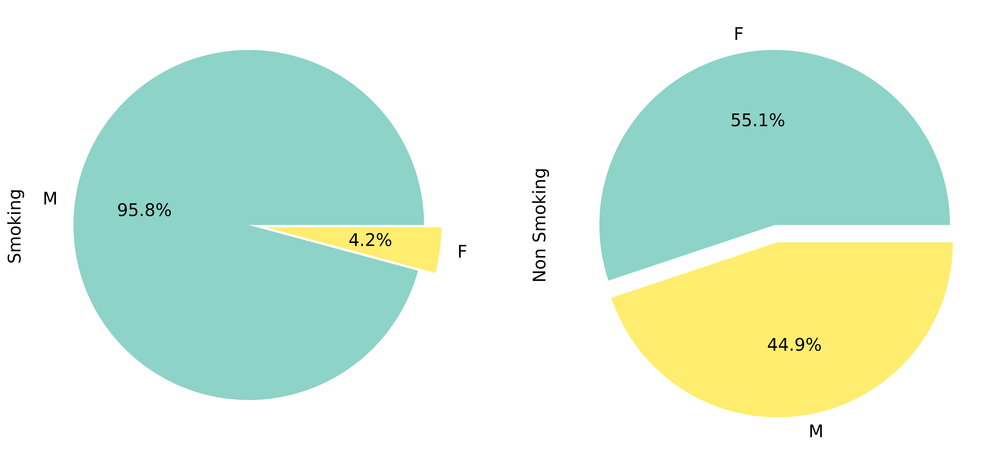

In [49]:
plt.figure(figsize=(20,20), dpi=600)
plt.subplot(121)
smoking['gender'].value_counts().plot.pie(explode=[0,0.1],autopct='%1.1f%%',fontsize=20,cmap='Set3')
plt.ylabel('Smoking', fontsize=20)

plt.subplot(122)
non_smoking['gender'].value_counts().plot.pie(explode=[0,0.1],autopct='%1.1f%%',fontsize=20,cmap='Set3')

plt.ylabel('Non Smoking', fontsize=20)
plt.savefig('images/gender&smoking.png')

#Data preparation and augmentation

Since the goal is to predict smokers and non-smokers based on health status, I will remove the attributes "gender", "age" and "height (cm)". Since the "oral" attribute has only one unique value, it will also be removed.

In [50]:
X = X.drop(['gender','age','height(cm)', 'oral'], axis=1)

Since there is a strong correlation between the attributes "Cholesterol" and "LDL" and the other two "AST" and "ALT". I will create new traits based on these two pairs.

In [51]:
X['Cholesterol/LDL'] = X['Cholesterol']/X['LDL']
X['AST/ALT'] = X['AST']/X['ALT']

In [52]:
X = X.reset_index()

In [53]:
X.shape

(55691, 25)

In [54]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [55]:
X_train.shape

(44552, 25)

Pipelining for easy data normalization. A SimpleImputer is used in case some data is missing in the future.

In [56]:
num_pipeline = Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler())
    ])

cat_pipeline = Pipeline([
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("cat_encoder", OneHotEncoder(sparse=False)),
    ])

In [57]:
num_attribs = ['Urine protein', 'eyesight(right)', 'eyesight(left)', 'weight(kg)', 
               'serum creatinine', 'relaxation', 'HDL', 'systolic', 'hemoglobin', 
               'ALT', 'AST', 'fasting blood sugar','Cholesterol', 'LDL', 'triglyceride',
               'waist(cm)', 'Gtp', 'Cholesterol/LDL', 'AST/ALT']
               
cat_attribs = ['dental caries', 'tartar', 'hearing(left)', 'hearing(right)']

preprocess_pipeline = ColumnTransformer([
        ("num", num_pipeline, num_attribs),
        ("cat", cat_pipeline, cat_attribs),
    ])

In [58]:
X_train = preprocess_pipeline.fit_transform(X_train[num_attribs + cat_attribs])

In [59]:
X_train.shape

(44552, 27)

In [60]:
X_test = preprocess_pipeline.transform(X_test[num_attribs + cat_attribs])

#Support Vector Machine

In [61]:
param_grid = [{'kernel':['linear', 'poly', 'rbf', 'sigmoid'], 'gamma':['scale', 'auto']}]

svc_clf = SVC()
grid_search = GridSearchCV(svc_clf, param_grid, cv=5, verbose=1)
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 8 candidates, totalling 40 fits


GridSearchCV(cv=5, estimator=SVC(),
             param_grid=[{'gamma': ['scale', 'auto'],
                          'kernel': ['linear', 'poly', 'rbf', 'sigmoid']}],
             verbose=1)

In [62]:
grid_search.best_params_

{'gamma': 'scale', 'kernel': 'rbf'}

In [63]:
svc_clf = SVC(kernel='rbf', gamma='scale')
svc_clf.fit(X_train, y_train)

SVC()

In [64]:
svc_train_pred = svc_clf.predict(X_train)
svc_train_acc = accuracy_score(svc_train_pred, y_train)
print(svc_train_acc * 100)

76.42978990842163


In [65]:
svc_test_pred = svc_clf.predict(X_test)
svc_test_acc = accuracy_score(svc_test_pred, y_test)
print(svc_test_acc * 100)

74.23467097585062


In [66]:
svc_cm = confusion_matrix(y_test, svc_test_pred)

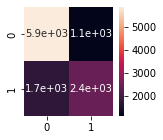

In [67]:
df_cm = pd.DataFrame(svc_cm, index = [i for i in "01"],
                  columns = [i for i in "01"])
plt.figure(figsize = (2,2))
knn_cm_heatmap = sns.heatmap(df_cm, annot=True)

In [68]:
svc_precision_score = precision_score(y_test, svc_test_pred)
svc_precision_score

0.6769749789148158

In [69]:
svc_recall_score = recall_score(y_test, svc_test_pred)
svc_recall_score

0.583192056187939

In [70]:
svc_f1_score = f1_score(y_test, svc_test_pred)
svc_f1_score

0.6265938069216757

In [71]:
precision, recall, thresholds = precision_recall_curve(y_test, svc_test_pred)

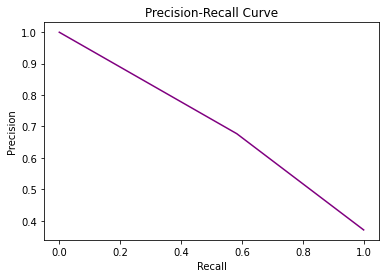

In [72]:
fig, ax = plt.subplots()
ax.plot(recall, precision, color='purple')

ax.set_title('Precision-Recall Curve')
ax.set_ylabel('Precision')
ax.set_xlabel('Recall')

plt.savefig('images/svc_precision-recall_curve.png')
plt.show()

In [73]:
fpr, tpr, thresholds = roc_curve(y_test, svc_test_pred)

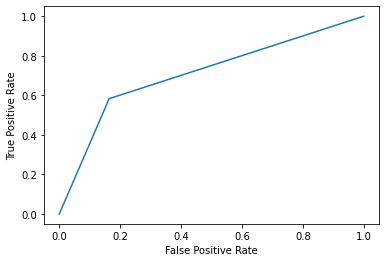

In [74]:
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

plt.savefig('images/svc_precision-recall_curve.png')
plt.show()

In [75]:
svc_roc_acc = roc_auc_score(y_test, svc_test_pred)
svc_roc_acc

0.7096416771667228

In [154]:
filename = 'models/svc_model.sav'
joblib.dump(svc_clf, filename)

['models/svc_model.sav']

#Decision Tree

In [76]:
param_grid = [{'n_estimators':[8,12,16], 'max_depth':[6,8,10]}]

forest_clf = RandomForestClassifier()
grid_search = GridSearchCV(forest_clf, param_grid, cv=5, verbose=1)
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 9 candidates, totalling 45 fits


GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid=[{'max_depth': [6, 8, 10],
                          'n_estimators': [8, 12, 16]}],
             verbose=1)

In [77]:
grid_search.best_params_

{'max_depth': 10, 'n_estimators': 16}

In [78]:
forest_clf = RandomForestClassifier(max_depth=10, n_estimators=12, random_state=42)
forest_clf.fit(X_train, y_train)

RandomForestClassifier(max_depth=10, n_estimators=12, random_state=42)

In [79]:
forest_train_pred = forest_clf.predict(X_train)
forest_train_acc = accuracy_score(forest_train_pred, y_train)
print(forest_train_acc * 100)

80.16250673370443


In [80]:
forest_test_pred = forest_clf.predict(X_test)
forest_test_acc = accuracy_score(forest_test_pred, y_test)
print(forest_test_acc * 100)

74.22569350929167


In [81]:
forest_cm = confusion_matrix(y_test, forest_test_pred)

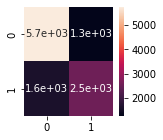

In [82]:
df_cm = pd.DataFrame(forest_cm, index = [i for i in "01"],
                  columns = [i for i in "01"])
plt.figure(figsize = (2,2))
knn_cm_heatmap = sns.heatmap(df_cm, annot=True)

In [83]:
forest_precision_score = precision_score(y_test, forest_test_pred)
forest_precision_score

0.6653522607781283

In [84]:
forest_recall_score = recall_score(y_test, forest_test_pred)
forest_recall_score

0.612981351416808

In [85]:
forest_f1_score = f1_score(y_test, forest_test_pred)
forest_f1_score

0.6380940375646035

In [86]:
precision, recall, thresholds = precision_recall_curve(y_test, forest_test_pred)

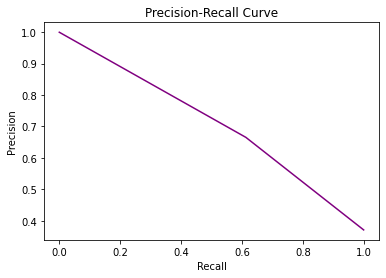

In [87]:
fig, ax = plt.subplots()
ax.plot(recall, precision, color='purple')

ax.set_title('Precision-Recall Curve')
ax.set_ylabel('Precision')
ax.set_xlabel('Recall')

plt.savefig('images/forest_precision-recall_curve.png')
plt.show()

In [88]:
fpr, tpr, thresholds = roc_curve(y_test, forest_test_pred)

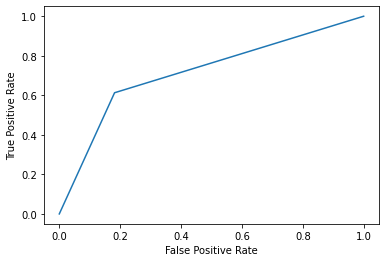

In [89]:
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

plt.savefig('images/forest_precision-recall_curve.png')
plt.show()

In [90]:
forest_roc_acc = roc_auc_score(y_test, forest_test_pred)
forest_roc_acc

0.7156918169352229

In [153]:
filename = 'models/forest_model.sav'
joblib.dump(forest_clf, filename)

['models/forest_model.sav']

#KNN

In [120]:
param_grid = [{'weights': ["uniform", "distance"], 'n_neighbors': [6,7,8]}]

knn_clf = KNeighborsClassifier()
grid_search = GridSearchCV(knn_clf, param_grid, cv=5, verbose=1)
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid=[{'n_neighbors': [6, 7, 8],
                          'weights': ['uniform', 'distance']}],
             verbose=1)

In [121]:
grid_search.best_params_

{'n_neighbors': 8, 'weights': 'distance'}

In [135]:
knn_clf = KNeighborsClassifier(n_neighbors=8, weights='distance')
knn_clf.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=8, weights='distance')

In [136]:
knn_train_pred = knn_clf.predict(X_train)
knn_train_acc = accuracy_score(knn_train_pred, y_train)
print(knn_train_acc * 100)

100.0


In [137]:
knn_test_pred = knn_clf.predict(X_test)
knn_test_acc = accuracy_score(knn_test_pred, y_test)
print(knn_test_acc * 100)

78.56180985725828


In [138]:
knn_cm = confusion_matrix(y_test, forest_test_pred)

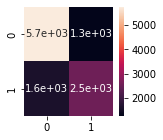

In [139]:
df_cm = pd.DataFrame(knn_cm, index = [i for i in "01"],
                  columns = [i for i in "01"])
plt.figure(figsize = (2,2))
knn_cm_heatmap = sns.heatmap(df_cm, annot=True)

In [140]:
knn_precision_score = precision_score(y_test, knn_test_pred)
knn_precision_score

0.7255765742420316

In [141]:
knn_recall_score = recall_score(y_test, knn_test_pred)
knn_recall_score

0.6781302978929523

In [142]:
knn_f1_score = f1_score(y_test, knn_test_pred)
knn_f1_score

0.7010515773660491

In [143]:
precision, recall, thresholds = precision_recall_curve(y_test, knn_test_pred)

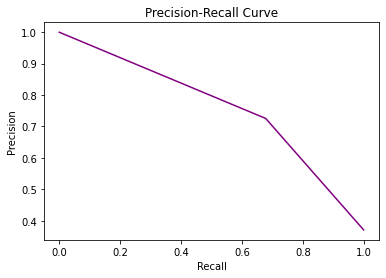

In [144]:
fig, ax = plt.subplots()
ax.plot(recall, precision, color='purple')

ax.set_title('Precision-Recall Curve')
ax.set_ylabel('Precision')
ax.set_xlabel('Recall')

plt.savefig('images/knn_precision-recall_curve.png')
plt.show()

In [145]:
fpr, tpr, thresholds = roc_curve(y_test, knn_test_pred)

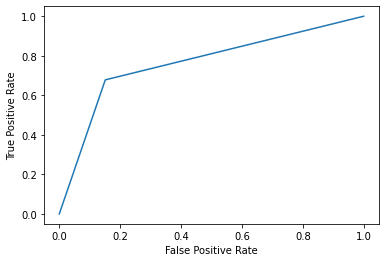

In [146]:
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

plt.savefig('images/knn_precision-recall_curve.png')
plt.show()

In [147]:
knn_roc_acc = roc_auc_score(y_test, knn_test_pred)
knn_roc_acc

0.7635301988751495

In [152]:
filename = 'models/knn_model.sav'
joblib.dump(knn_clf, filename)

['models/knn_model.sav']

#Summary

In [149]:
summary = pd.DataFrame(np.array(['SVC', svc_test_acc, svc_precision_score, svc_recall_score, svc_f1_score, svc_roc_acc,
                        'Random Forest', forest_test_acc, forest_precision_score, forest_recall_score, forest_f1_score, forest_roc_acc,
                        'KNN', knn_test_acc, knn_precision_score, knn_recall_score, knn_f1_score, knn_roc_acc,]).reshape(3, 6),
                       columns=['Name', 'Accuracy', 'Precision', 'Recall', 'F1', 'ROC'])

In [150]:
summary

,Name,Accuracy,Precision,Recall,F1,ROC
0,SVC,0.7423467097585061,0.6769749789148158,0.583192056187939,0.6265938069216757,0.7096416771667228
1,Random Forest,0.7422569350929168,0.6653522607781283,0.612981351416808,0.6380940375646035,0.7156918169352229
2,KNN,0.7856180985725828,0.7255765742420316,0.6781302978929523,0.7010515773660491,0.7635301988751495
